# Road extraction - Colab (SAM-Road only)

Enter one lat/lon, download one tile, run **SAM-Road** on it, and see the result
(overlay + mask). SAM-Road outputs a road *graph* (not just a mask) and includes
gamma correction + A* gap-reconnection post-processing, already built in.

Zero-shot on CityScale weights (US/Australian cities) - it has never seen a
Bangladesh image. Expect it to do reasonably on wide paved roads, weaker on
narrow unpaved village tracks (this project's own testing found it detects
meaningfully less road than a rural-trained model like D-LinkNet on the same
Bangladesh tile - see `models/samroad.py` docstring for the honest numbers).

**Fully self-contained:** the core pipeline (config, tiling, vectorising) is written
out by cell 3 below, not cloned. SAM-Road's own code + checkpoints are cloned/downloaded
live into this Colab session in cell 4 - nothing is read from your local machine.

Run all cells top to bottom. Cell 5 will ask you for coordinates.

`Runtime` -> `Change runtime type` -> `T4 GPU` matters a lot here - SAM-Road runs a
ViT-B encoder over many patches; a GPU turns minutes into seconds.


In [1]:
# Colab already has numpy, scipy, pillow, requests, torch, torchvision.
!pip -q install rasterio shapely pyproj scikit-image

import os
os.chdir("/content")
os.makedirs("CNN", exist_ok=True)
os.chdir("CNN")

# models/weights/ is not tracked by git in the source project, so a fresh clone/rebuild
# never has it - create every directory explicitly instead of assuming it exists.
for d in ["core", "models/weights", "data/images", "data/osm",
          "outputs/images", "outputs/geojson", "reports"]:
    os.makedirs(d, exist_ok=True)
print("directories ready")


directories ready


In [2]:
# The exact project files, tested locally - written verbatim, not rewritten.
FILES = {
    'config.py': '"""\nAll fixed settings for the project.\nChange values HERE and nowhere else.\n"""\nfrom pathlib import Path\n\nROOT = Path(__file__).parent\n\n# ---------- folders ----------\nDATA_IMAGES = ROOT / "data" / "images"     # downloaded satellite GeoTIFFs\nOSM_DIR     = ROOT / "data" / "osm"        # put bangladesh-260823.osm.pbf here\nOUT_IMAGES  = ROOT / "outputs" / "images"  # overlay pictures  <name>_<model>.png\nOUT_GEOJSON = ROOT / "outputs" / "geojson" # road vectors      <name>_<model>.geojson\nREPORTS     = ROOT / "reports"             # validation.csv\nWEIGHTS     = ROOT / "models" / "weights"  # put .pth files here\n\n# ---------- imagery standard (hardcoded on purpose) ----------\nZOOM     = 18     # ~0.55 m/pixel in Bangladesh -> matches DeepGlobe/SpaceNet training data\nSIZE_PX  = 2048   # downloaded image is 2048x2048  (~1.1 km x 1.1 km)\nPATCH_PX = 512    # models see 512x512 patches (16 patches per image)\nOVERLAP_PX = 96   # patches overlap by this much; blended so seams disappear\n\nBASEMAP = ("https://services.arcgisonline.com/ArcGIS/rest/services/"\n           "World_Imagery/MapServer/tile/{z}/{y}/{x}")\nUSER_AGENT = "road-extraction-research/0.1"\n\n# ---------- mask -> vector ----------\nTHRESHOLD   = 0.5   # probability above this = road\nMIN_ROAD_PX = 40    # delete blobs smaller than this (removes specks)\nSIMPLIFY_M  = 2.0   # line smoothing tolerance, metres\n\n# ---------- validation ----------\nOSM_PBF        = OSM_DIR / "bangladesh-260823.osm.pbf"\nOSM_ROAD_WIDTH = 4.0   # metres, half-width used to draw OSM roads as a mask\nMATCH_SLACK_PX = 8     # a prediction within this many pixels of OSM counts as a match\n\nfor _d in (DATA_IMAGES, OSM_DIR, OUT_IMAGES, OUT_GEOJSON, REPORTS, WEIGHTS):\n    _d.mkdir(parents=True, exist_ok=True)\n',
    'core/__init__.py': '',
    'core/geo.py': '"""\nCoordinate maths.\n\nTwo coordinate systems are used:\n  EPSG:4326 - plain lat/lon degrees   (what iD / JOSM / GeoJSON use)\n  EPSG:3857 - Web Mercator metres     (what map tiles use)\n"""\nimport math\n\nTILE_PX = 256\nORIGIN = 20037508.342789244   # half the width of the Web Mercator world, in metres\n\n\ndef latlon_to_pixel(lat, lon, zoom):\n    """Global pixel coordinate of a lat/lon at a given zoom level."""\n    n = TILE_PX * (2 ** zoom)\n    x = (lon + 180.0) / 360.0 * n\n    lat_r = math.radians(lat)\n    y = (1.0 - math.log(math.tan(lat_r) + 1.0 / math.cos(lat_r)) / math.pi) / 2.0 * n\n    return x, y\n\n\ndef pixel_to_latlon(x, y, zoom):\n    """Inverse of latlon_to_pixel."""\n    n = TILE_PX * (2 ** zoom)\n    lon = x / n * 360.0 - 180.0\n    lat = math.degrees(math.atan(math.sinh(math.pi * (1.0 - 2.0 * y / n))))\n    return lat, lon\n\n\ndef mercator_res(zoom):\n    """Metres per pixel in EPSG:3857 (constant, not corrected for latitude)."""\n    return 2.0 * ORIGIN / (TILE_PX * (2 ** zoom))\n\n\ndef ground_res(lat, zoom):\n    """Real metres per pixel on the ground at this latitude. This is the GSD."""\n    return 156543.03392 * math.cos(math.radians(lat)) / (2 ** zoom)\n\n\ndef raster_center_latlon(src):\n    """Centre of an open rasterio dataset, as (lat, lon)."""\n    from pyproj import Transformer\n    b = src.bounds\n    cx, cy = (b.left + b.right) / 2.0, (b.bottom + b.top) / 2.0\n    t = Transformer.from_crs(src.crs, "EPSG:4326", always_xy=True)\n    lon, lat = t.transform(cx, cy)\n    return lat, lon\n\n\ndef raster_bounds_latlon(src):\n    """Bounding box of an open rasterio dataset as (west, south, east, north) in degrees."""\n    from pyproj import Transformer\n    b = src.bounds\n    t = Transformer.from_crs(src.crs, "EPSG:4326", always_xy=True)\n    west, south = t.transform(b.left, b.bottom)\n    east, north = t.transform(b.right, b.top)\n    return west, south, east, north\n',
    'core/tiling.py': '"""\nRun a patch-based model over a big image without seams at patch edges.\n\nA model only sees one 512x512 patch at a time, so a road running along a\npatch boundary gets cut with no context on one side - the prediction is\nweakest exactly at every seam. The fix costs no training: overlap the\npatches and blend the overlapping region, weighted so each pixel is\ninfluenced most by the patch where it sits closest to the centre (a Hann\nwindow). Free accuracy, pretrained model unchanged.\n"""\nimport numpy as np\n\n\ndef _hann_window(size):\n    w1d = np.hanning(size + 2)[1:-1]           # avoid the zero endpoints\n    return np.outer(w1d, w1d).astype(np.float32)\n\n\ndef tiled_predict(model, image, patch_px, overlap_px):\n    """Run model.predict() over overlapping patches and blend the results."""\n    h, w = image.shape[:2]\n    stride = patch_px - overlap_px\n    window = _hann_window(patch_px)\n\n    acc = np.zeros((h, w), np.float32)\n    weight = np.zeros((h, w), np.float32)\n\n    rows = list(range(0, max(h - patch_px, 0) + 1, stride)) or [0]\n    cols = list(range(0, max(w - patch_px, 0) + 1, stride)) or [0]\n    if rows[-1] + patch_px < h:\n        rows.append(h - patch_px)\n    if cols[-1] + patch_px < w:\n        cols.append(w - patch_px)\n\n    for r in rows:\n        for c in cols:\n            tile = image[r:r + patch_px, c:c + patch_px]\n            th, tw = tile.shape[:2]\n            if (th, tw) != (patch_px, patch_px):\n                pad = np.zeros((patch_px, patch_px, 3), tile.dtype)\n                pad[:th, :tw] = tile\n                tile = pad\n\n            out = model.predict(tile)\n            acc[r:r + th, c:c + tw] += (out * window)[:th, :tw]\n            weight[r:r + th, c:c + tw] += window[:th, :tw]\n\n    weight[weight == 0] = 1.0\n    return (acc / weight).astype(np.float32)\n',
    'core/vectorize.py': '"""\nTurn a road probability map into GeoJSON lines.\n\n    probability (float 0-1)\n      -> threshold        -> binary mask\n      -> remove specks\n      -> skeletonize      -> 1-pixel-wide centre lines\n      -> trace            -> ordered pixel paths\n      -> simplify         -> fewer points\n      -> reproject        -> lat/lon LineStrings\n"""\nimport inspect\nimport json\nimport math\n\nimport numpy as np\nfrom shapely.geometry import LineString\nfrom skimage.draw import line as _draw_line\nfrom skimage.morphology import remove_small_objects, skeletonize\n\n_NB = [(-1, -1), (-1, 0), (-1, 1), (0, -1), (0, 1), (1, -1), (1, 0), (1, 1)]\n\n\n_RSO_ARGS = inspect.signature(remove_small_objects).parameters\n\n\ndef prob_to_mask(prob, threshold, min_px):\n    """Threshold the probability map and delete blobs smaller than min_px."""\n    mask = prob >= threshold\n    if min_px > 0:\n        # scikit-image renamed min_size -> max_size in 0.26 (and changed it to\n        # "smaller than or equal to"), so support both spellings\n        if "max_size" in _RSO_ARGS:\n            mask = remove_small_objects(mask, max_size=min_px - 1)\n        else:\n            mask = remove_small_objects(mask, min_size=min_px)\n    return mask\n\n\ndef _neighbors(sk, r, c):\n    h, w = sk.shape\n    out = []\n    for dr, dc in _NB:\n        rr, cc = r + dr, c + dc\n        if 0 <= rr < h and 0 <= cc < w and sk[rr, cc]:\n            out.append((rr, cc))\n    return out\n\n\ndef mask_to_paths(mask):\n    """Skeletonize the mask and return a list of pixel paths [(row, col), ...]."""\n    sk = skeletonize(mask.astype(bool))\n    pts = list(zip(*np.nonzero(sk)))\n    if not pts:\n        return []\n\n    degree = {p: len(_neighbors(sk, *p)) for p in pts}\n    nodes = [p for p in pts if degree[p] != 2]          # endpoints and junctions\n\n    paths, started = [], set()\n\n    def walk(a, b):\n        path, prev, cur = [a, b], a, b\n        while degree.get(cur, 0) == 2:\n            nxt = [n for n in _neighbors(sk, *cur) if n != prev]\n            if not nxt:\n                break\n            prev, cur = cur, nxt[0]\n            path.append(cur)\n        return path\n\n    for n in nodes:\n        for nb in _neighbors(sk, *n):\n            if frozenset((n, nb)) in started:\n                continue\n            p = walk(n, nb)\n            started.add(frozenset((p[0], p[1])))\n            started.add(frozenset((p[-1], p[-2])))\n            paths.append(p)\n\n    # closed loops have no endpoint or junction, so the walk above never reaches them\n    left = set(pts) - {q for p in paths for q in p}\n    while left:\n        start = next(iter(left))\n        left.discard(start)\n        path, cur = [start], start\n        while True:\n            nxt = [n for n in _neighbors(sk, *cur) if n in left]\n            if not nxt:\n                break\n            cur = nxt[0]\n            left.discard(cur)\n            path.append(cur)\n        if len(path) > 1:\n            paths.append(path)\n\n    return paths\n\n\ndef paths_to_mask(paths, shape):\n    """Rasterize pixel paths back into a mask. Only used for the overlay picture."""\n    mask = np.zeros(shape, bool)\n    h, w = shape\n    for path in paths:\n        for (r0, c0), (r1, c1) in zip(path, path[1:]):\n            rr, cc = _draw_line(int(r0), int(c0), int(r1), int(c1))\n            keep = (rr >= 0) & (rr < h) & (cc >= 0) & (cc < w)\n            mask[rr[keep], cc[keep]] = True\n    return mask\n\n\ndef paths_to_geojson(paths, transform, crs, center_lat,\n                     simplify_m=2.0, min_len_m=15.0, props=None):\n    """Convert pixel paths to a GeoJSON FeatureCollection in EPSG:4326."""\n    from pyproj import Transformer\n\n    to_wgs = Transformer.from_crs(crs, "EPSG:4326", always_xy=True)\n    # Web Mercator exaggerates distance by 1/cos(lat); undo it for real metres\n    scale = math.cos(math.radians(center_lat))\n\n    features = []\n    for path in paths:\n        if len(path) < 2:\n            continue\n        xy = [transform * (c + 0.5, r + 0.5) for r, c in path]\n        line = LineString(xy).simplify(simplify_m)\n        length_m = line.length * scale\n        if length_m < min_len_m:\n            continue\n\n        xs = [p[0] for p in line.coords]\n        ys = [p[1] for p in line.coords]\n        lons, lats = to_wgs.transform(xs, ys)\n        coords = [[round(float(a), 7), round(float(b), 7)] for a, b in zip(lons, lats)]\n\n        p = dict(props or {})\n        p["length_m"] = round(float(length_m), 1)\n        features.append({"type": "Feature", "properties": p,\n                         "geometry": {"type": "LineString", "coordinates": coords}})\n\n    return {"type": "FeatureCollection", "features": features}\n\n\ndef save_geojson(fc, path):\n    with open(path, "w") as f:\n        json.dump(fc, f)\n    return path\n',
    'core/viz.py': '"""Overlay pictures so you can judge the result by eye."""\nimport numpy as np\nfrom PIL import Image\n\n\ndef save_overlay(image_rgb, mask, path, color=(255, 40, 40), alpha=0.55):\n    """Paint the predicted mask on top of the satellite image and save a PNG."""\n    out = image_rgb.astype(np.float32).copy()\n    tint = np.array(color, dtype=np.float32)\n    sel = mask.astype(bool)\n    out[sel] = (1.0 - alpha) * out[sel] + alpha * tint\n    Image.fromarray(out.clip(0, 255).astype(np.uint8)).save(path)\n    return path\n\n\ndef save_mask(mask, path):\n    Image.fromarray((mask.astype(np.uint8) * 255)).save(path)\n    return path\n',
    'core/registry.py': '"""\nFinds every model automatically.\n\nDrop a new file in models/ that defines a class inheriting RoadModel,\nand it becomes available immediately. No other file needs editing.\nFiles starting with \'_\' are ignored.\n"""\nimport importlib\nimport pkgutil\nfrom pathlib import Path\n\nimport models\nfrom models._base import RoadModel\n\n\ndef discover():\n    """Return {model_name: model_class} for every model file in models/."""\n    found = {}\n    pkg_dir = Path(models.__file__).parent\n    for info in pkgutil.iter_modules([str(pkg_dir)]):\n        if info.name.startswith("_"):\n            continue\n        module = importlib.import_module(f"models.{info.name}")\n        for obj in vars(module).values():\n            if (isinstance(obj, type) and issubclass(obj, RoadModel)\n                    and obj is not RoadModel):\n                found[obj.name] = obj\n    return found\n',
    'core/reconnect.py': '"""\nOcclusion post-processing for graph-output models, adapted from:\n  Fathul\'ibad et al., "Improving SAM-Road Model for Occlusion Handling in\n  Road Networks Extraction from Satellite Images with Gamma Correction and\n  Modified A* Algorithm", JISEBI 12(1), 2026.\n\nTwo independent steps, both applied AFTER a model has already run - no\nretraining, no change to the model\'s weights:\n\n  1. gamma_correct() - brightens a road-probability mask so segments dimmed\n     by shadows/trees/buildings become detectable. Can only help pixels the\n     model already gave *some* nonzero confidence to; it cannot invent\n     detections where the model saw nothing.\n\n  2. reconnect_graph() - bridges disconnected graph fragments by running A*\n     across a small window, using the (gamma-corrected) probability mask as\n     a cost surface so the path prefers pixels the model was at least\n     somewhat confident about.\n\nSIMPLIFICATIONS vs the paper (documented, not hidden)\n------------------------------------------------------\n- The paper\'s MIN_GRAPH_DISTANCE governs how close two nodes may already be\n  *through the existing graph* before a new bridge is disallowed. Here it is\n  approximated as "candidates must be in a different connected component" -\n  correct for a graph this sparse (see caller), a real simplification for a\n  denser one.\n- Endpoints are only bridged in the roughly-forward direction implied by\n  their single existing edge (a dead end shouldn\'t jump backwards). Isolated\n  points (no edge at all) are bridged in any direction.\n- Only the nearest valid candidate per endpoint is attempted, once, in a\n  single pass - not the paper\'s full iterative graph search.\n"""\nimport heapq\n\nimport numpy as np\nfrom scipy.sparse import coo_matrix\nfrom scipy.sparse.csgraph import connected_components\n\n_NB8 = [(-1, -1, 2 ** 0.5), (-1, 0, 1.0), (-1, 1, 2 ** 0.5), (0, -1, 1.0),\n        (0, 1, 1.0), (1, -1, 2 ** 0.5), (1, 0, 1.0), (1, 1, 2 ** 0.5)]\n\n\ndef gamma_correct(mask_uint8, gamma):\n    """f0 = fi^(1/gamma), gamma > 1 brightens dim regions. gamma<=1 is a no-op."""\n    if gamma <= 1.0:\n        return mask_uint8\n    norm = mask_uint8.astype(np.float32) / 255.0\n    corrected = norm ** (1.0 / gamma)\n    return (corrected * 255.0).astype(np.uint8)\n\n\ndef _astar(cost_norm, p0, p1, pad, penalty):\n    """Grid A* from p0 to p1 (x, y pixel coords) over a small cropped window.\n    cost_norm: float array in [0,1], higher = more road-like = cheaper to cross.\n    Returns a list of (row, col) pixels, or None if p0/p1 fall outside the window."""\n    h, w = cost_norm.shape\n    x0, y0 = p0\n    x1, y1 = p1\n    r0, r1 = sorted((int(y0), int(y1)))\n    c0, c1 = sorted((int(x0), int(x1)))\n    r0, c0 = max(0, r0 - pad), max(0, c0 - pad)\n    r1, c1 = min(h - 1, r1 + pad), min(w - 1, c1 + pad)\n\n    start = (int(y0) - r0, int(x0) - c0)\n    goal = (int(y1) - r0, int(x1) - c0)\n    H, W = r1 - r0 + 1, c1 - c0 + 1\n    if not (0 <= start[0] < H and 0 <= start[1] < W and 0 <= goal[0] < H and 0 <= goal[1] < W):\n        return None\n\n    def step_cost(r, c):\n        return 1.0 + penalty * (1.0 - cost_norm[r0 + r, c0 + c])\n\n    def heuristic(r, c):\n        return ((r - goal[0]) ** 2 + (c - goal[1]) ** 2) ** 0.5\n\n    open_heap = [(heuristic(*start), 0.0, start)]\n    best_g = {start: 0.0}\n    came_from = {}\n    visited = set()\n\n    while open_heap:\n        _, g, cur = heapq.heappop(open_heap)\n        if cur in visited:\n            continue\n        visited.add(cur)\n        if cur == goal:\n            path = [cur]\n            while cur in came_from:\n                cur = came_from[cur]\n                path.append(cur)\n            path.reverse()\n            return [(r0 + r, c0 + c) for r, c in path]\n\n        r, c = cur\n        for dr, dc, base in _NB8:\n            nr, nc = r + dr, c + dc\n            if 0 <= nr < H and 0 <= nc < W:\n                ng = g + base * step_cost(nr, nc)\n                if ng < best_g.get((nr, nc), float("inf")):\n                    best_g[(nr, nc)] = ng\n                    came_from[(nr, nc)] = cur\n                    heapq.heappush(open_heap, (ng + heuristic(nr, nc), ng, (nr, nc)))\n    return None\n\n\ndef reconnect_graph(points_xy, edges, cost_norm, max_straight_px,\n                    astar_pad=12, cost_penalty=5.0):\n    """\n    points_xy   : (N, 2) array of (x, y) pixel coordinates\n    edges       : list of (i, j) index pairs into points_xy - the graph as it stands\n    cost_norm   : float array in [0,1], same shape as the image (gamma-corrected road mask)\n    max_straight_px : only search for a bridge within this pixel radius\n\n    Returns extra paths (each [(row, col), ...]) to append alongside the\n    model\'s own edges - bridges across gaps the model left disconnected.\n    """\n    n = len(points_xy)\n    if n == 0:\n        return []\n\n    if edges:\n        rows = [a for a, b in edges] + [b for a, b in edges]\n        cols = [b for a, b in edges] + [a for a, b in edges]\n        adj = coo_matrix((np.ones(len(rows)), (rows, cols)), shape=(n, n))\n    else:\n        adj = coo_matrix((n, n))\n    _, labels = connected_components(adj, directed=False)\n\n    degree = np.zeros(n, dtype=int)\n    neighbor = {}\n    for a, b in edges:\n        degree[a] += 1\n        degree[b] += 1\n        neighbor[a] = b\n        neighbor[b] = a\n\n    candidates = np.flatnonzero(degree <= 1)   # dead ends and isolated points\n    bridges = []\n    bridged_pairs = set()\n\n    for i in candidates:\n        pi = points_xy[i]\n        direction = None\n        if degree[i] == 1:\n            d = pi - points_xy[neighbor[i]]\n            norm = np.linalg.norm(d)\n            if norm > 0:\n                direction = d / norm\n\n        best_j, best_dist = None, float("inf")\n        for j in candidates:\n            if j == i or labels[j] == labels[i]:\n                continue\n            pj = points_xy[j]\n            dist = np.linalg.norm(pj - pi)\n            if dist > max_straight_px or dist >= best_dist:\n                continue\n            if direction is not None:\n                fwd = pj - pi\n                fwd_norm = np.linalg.norm(fwd)\n                if fwd_norm == 0 or np.dot(fwd / fwd_norm, direction) <= 0:\n                    continue\n            best_j, best_dist = j, dist\n\n        if best_j is None:\n            continue\n        pair = (min(i, best_j), max(i, best_j))\n        if pair in bridged_pairs:\n            continue\n\n        path = _astar(cost_norm, pi, points_xy[best_j], astar_pad, cost_penalty)\n        if path is not None and len(path) > 1:\n            bridges.append(path)\n            bridged_pairs.add(pair)\n            labels[labels == labels[best_j]] = labels[i]   # merge components\n\n    return bridges\n',
    'models/__init__.py': '',
    'models/_base.py': '"""\nThe one interface every model must follow.\n\nTo add a model, create models/<yourmodel>.py containing:\n\n    from models._base import RoadModel\n\n    class YourModel(RoadModel):\n        name = "yourmodel"          # used in output filenames\n\n        def load(self):\n            ...                     # load weights once\n\n        def predict(self, patch):\n            ...                     # return float32 HxW, values 0..1\n\nNothing else in the project needs to change.\n"""\nimport numpy as np\n\n\nclass RoadModel:\n    name = "unnamed"\n    description = ""\n\n    # "mask"  -> implement predict();       the pipeline skeletonizes for you\n    # "graph" -> implement predict_graph(); the model gives lines directly\n    outputs = "mask"\n\n    def load(self):\n        """Called once before the first predict(). Load weights here."""\n        return self\n\n    def predict(self, patch: np.ndarray) -> np.ndarray:\n        """\n        Mask models implement this. Called once per 512x512 patch.\n\n        patch  : uint8 array, shape (H, W, 3), RGB\n        returns: float32 array, shape (H, W), 0.0 = not road, 1.0 = road\n        """\n        raise NotImplementedError\n\n    def predict_graph(self, image: np.ndarray):\n        """\n        Graph models implement this instead. Called once on the whole image.\n\n        image  : uint8 array, shape (H, W, 3), RGB\n        returns: list of paths, each a list of (row, col) pixel pairs\n        """\n        raise NotImplementedError\n',
    'download.py': '"""\nSTEP 1 - download a satellite image for a lat/lon.\n\n    uv run download.py 23.846073, 90.389624 airport_road\n\nWrites:\n    data/images/<name>.tif   georeferenced, used by extract.py\n    data/images/<name>.png   plain picture, just to look at\n\nZoom and size are fixed in config.py (z18, 2048x2048, about 1.1 km across).\n"""\nimport io\nimport math\nimport re\nimport sys\n\nimport numpy as np\nimport rasterio\nimport requests\nfrom PIL import Image\nfrom rasterio.transform import Affine\n\nimport config\nfrom core.geo import ORIGIN, TILE_PX, ground_res, latlon_to_pixel\n\nImage.MAX_IMAGE_PIXELS = None\n\n\ndef _fetch_tile(session, z, x, y):\n    url = config.BASEMAP.format(z=z, x=x, y=y)\n    r = session.get(url, timeout=30)\n    r.raise_for_status()\n    return Image.open(io.BytesIO(r.content)).convert("RGB")\n\n\ndef download(lat, lon, name, zoom=config.ZOOM, size=config.SIZE_PX):\n    # where the image sits in the global pixel grid\n    cx, cy = latlon_to_pixel(lat, lon, zoom)\n    x0, y0 = int(round(cx - size / 2)), int(round(cy - size / 2))\n\n    tx0, ty0 = x0 // TILE_PX, y0 // TILE_PX\n    tx1, ty1 = (x0 + size - 1) // TILE_PX, (y0 + size - 1) // TILE_PX\n    n_tiles = (tx1 - tx0 + 1) * (ty1 - ty0 + 1)\n\n    gsd = ground_res(lat, zoom)\n    print(f"[download] {name}  lat={lat} lon={lon} z={zoom}")\n    print(f"[download] {size}x{size} px  ~{gsd:.2f} m/px  "\n          f"~{size * gsd / 1000:.2f} km across  ({n_tiles} tiles)")\n\n    canvas = Image.new("RGB", ((tx1 - tx0 + 1) * TILE_PX, (ty1 - ty0 + 1) * TILE_PX))\n    session = requests.Session()\n    session.headers["User-Agent"] = config.USER_AGENT\n\n    done = 0\n    for ty in range(ty0, ty1 + 1):\n        for tx in range(tx0, tx1 + 1):\n            tile = _fetch_tile(session, zoom, tx, ty)\n            canvas.paste(tile, ((tx - tx0) * TILE_PX, (ty - ty0) * TILE_PX))\n            done += 1\n            print(f"\\r[download]   tile {done}/{n_tiles}", end="", flush=True)\n    print()\n\n    ox, oy = x0 - tx0 * TILE_PX, y0 - ty0 * TILE_PX\n    img = canvas.crop((ox, oy, ox + size, oy + size))\n\n    # georeference: top-left corner in Web Mercator metres\n    res = 2.0 * ORIGIN / (TILE_PX * 2 ** zoom)\n    west = -ORIGIN + x0 * res\n    north = ORIGIN - y0 * res\n    transform = Affine.translation(west, north) * Affine.scale(res, -res)\n\n    arr = np.asarray(img)\n    tif = config.DATA_IMAGES / f"{name}.tif"\n    with rasterio.open(tif, "w", driver="GTiff", height=size, width=size,\n                       count=3, dtype="uint8", crs="EPSG:3857",\n                       transform=transform, compress="deflate") as dst:\n        dst.write(arr.transpose(2, 0, 1))\n\n    png = config.DATA_IMAGES / f"{name}.png"\n    img.save(png)\n\n    print(f"[download] saved {tif}")\n    print(f"[download] saved {png}")\n    return tif\n\n\nUSAGE = """usage: uv run download.py <lat> <lon> [name]\n\nexamples:\n  uv run download.py 23.846073, 90.389624 airport_road\n  uv run download.py 23.846073 90.389624 airport_road\n  uv run download.py 23.846073,90.389624\n\nPaste coordinates straight from OpenStreetMap or Google - the comma is fine.\nIf you leave out the name, one is made from the coordinates.\n"""\n\n\ndef parse_cli(argv):\n    """Accept \'23.8, 90.3 name\', \'23.8,90.3 name\' or \'23.8 90.3 name\'."""\n    tokens = [t for a in argv for t in re.split(r"[,\\s]+", a) if t]\n    if len(tokens) < 2:\n        sys.exit(USAGE)\n    try:\n        lat, lon = float(tokens[0]), float(tokens[1])\n    except ValueError:\n        sys.exit(USAGE)\n    name = "_".join(tokens[2:]) if len(tokens) > 2 else f"aoi_{lat:.5f}_{lon:.5f}"\n    return lat, lon, re.sub(r"[^0-9A-Za-z._-]", "_", name)\n\n\ndef main():\n    argv = sys.argv[1:]\n    if not argv or argv[0] in ("-h", "--help"):\n        sys.exit(USAGE)\n\n    lat, lon, name = parse_cli(argv)\n    if not (20.0 <= lat <= 27.0 and 88.0 <= lon <= 93.0):\n        print("[warn] coordinates are outside Bangladesh - are lat and lon swapped?",\n              file=sys.stderr)\n\n    download(lat, lon, name)\n\n\nif __name__ == "__main__":\n    main()\n',
    'extract.py': '"""\nSTEP 2 - run a model on a downloaded image and produce roads.\n\n    uv run extract.py airport_road\n    uv run extract.py airport_road baseline\n    uv run extract.py airport_road all\n    uv run extract.py list\n\nWrites:\n    outputs/geojson/<name>_<model>.geojson   <- drag this into iD\n    outputs/images/<name>_<model>.png        <- red overlay, judge by eye\n    outputs/images/<name>_<model>_mask.png\n"""\nimport sys\nimport time\n\nimport numpy as np\nimport rasterio\n\nimport config\nfrom core.geo import raster_center_latlon\nfrom core.registry import discover\nfrom core.tiling import tiled_predict\nfrom core.vectorize import (mask_to_paths, paths_to_geojson, paths_to_mask,\n                            prob_to_mask, save_geojson)\nfrom core.viz import save_mask, save_overlay\n\n\ndef run(name, model_name):\n    tif = config.DATA_IMAGES / f"{name}.tif"\n    if not tif.exists():\n        sys.exit(f"No image at {tif}\\nRun download.py first.")\n\n    with rasterio.open(tif) as src:\n        image = src.read([1, 2, 3]).transpose(1, 2, 0)\n        transform, crs = src.transform, src.crs\n        lat, lon = raster_center_latlon(src)\n\n    models = discover()\n    if model_name not in models:\n        sys.exit(f"Unknown model \'{model_name}\'. Available: {\', \'.join(sorted(models))}")\n\n    print(f"[extract] {name}  model={model_name}")\n    t0 = time.time()\n    model = models[model_name]().load()\n\n    if getattr(model, "outputs", "mask") == "graph":\n        # the model returns road lines directly - no thresholding needed\n        paths = model.predict_graph(image)\n        mask = paths_to_mask(paths, image.shape[:2])\n    else:\n        prob = tiled_predict(model, image, config.PATCH_PX, config.OVERLAP_PX)\n        mask = prob_to_mask(prob, config.THRESHOLD, config.MIN_ROAD_PX)\n        paths = mask_to_paths(mask)\n    fc = paths_to_geojson(paths, transform, crs, lat,\n                          simplify_m=config.SIMPLIFY_M,\n                          props={"model": model_name, "aoi": name})\n\n    stem = f"{name}_{model_name}"\n    gj = save_geojson(fc, config.OUT_GEOJSON / f"{stem}.geojson")\n    ov = save_overlay(image, mask, config.OUT_IMAGES / f"{stem}.png")\n    mk = save_mask(mask, config.OUT_IMAGES / f"{stem}_mask.png")\n\n    total_km = sum(f["properties"]["length_m"] for f in fc["features"]) / 1000.0\n    print(f"[extract] {len(fc[\'features\'])} road lines, {total_km:.2f} km total"\n          f"  ({time.time() - t0:.1f}s)")\n    print(f"[extract] saved {gj}")\n    print(f"[extract] saved {ov}")\n    print(f"[extract] saved {mk}")\n    return gj\n\n\nUSAGE = """usage: uv run extract.py <name> [model]\n\nexamples:\n  uv run extract.py airport_road            # uses the baseline model\n  uv run extract.py airport_road baseline\n  uv run extract.py airport_road all        # every model\n  uv run extract.py list                    # show available models\n\n<name> is the name you gave download.py.\n"""\n\n\ndef main():\n    argv = sys.argv[1:]\n    if not argv or argv[0] in ("-h", "--help"):\n        sys.exit(USAGE)\n\n    models = discover()\n    if argv[0] in ("list", "--list"):\n        for n, cls in sorted(models.items()):\n            print(f"  {n:<12} {cls.description}")\n        return\n\n    name = argv[0]\n    wanted = argv[1] if len(argv) > 1 else "baseline"\n    targets = sorted(models) if wanted == "all" else [wanted]\n    for m in targets:\n        run(name, m)\n\n\nif __name__ == "__main__":\n    main()\n',
}

from pathlib import Path
for relpath, content in FILES.items():
    p = Path(relpath)
    p.parent.mkdir(parents=True, exist_ok=True)
    p.write_text(content)
print(f"wrote {len(FILES)} files")


wrote 12 files


In [3]:
from pathlib import Path

WEIGHTS_DIR = Path("models/weights")
WEIGHTS_DIR.mkdir(parents=True, exist_ok=True)   # models/weights/ isn't tracked by git

def check_weight(path, min_bytes, label):
    p = Path(path)
    size = p.stat().st_size if p.exists() else 0
    ok = size >= min_bytes
    status = "OK" if ok else "MISSING or TOO SMALL"
    print(f"  {label}: {size / 1e6:.1f} MB  [{status}]")
    if not ok:
        print(f"    ERROR: {label} did not download correctly - re-run this cell, "
              f"or check your network connection.")
    return ok


In [4]:
# SAM-Road - clone straight into this Colab session (self-contained; nothing
# is read from your local machine, everything below lives inside /content/CNN).
import os
from pathlib import Path

SAM_ROAD_DIR = Path("sam_road")
if not (SAM_ROAD_DIR / "model.py").exists():
    print("Cloning sam_road...")
    get_ipython().system('git clone --depth 1 https://github.com/htcr/sam_road.git sam_road')
if not (SAM_ROAD_DIR / "sam" / "segment_anything").exists():
    print("Cloning segment-anything-road (SAM encoder)...")
    get_ipython().system('git clone --depth 1 https://github.com/htcr/segment-anything-road.git sam_road/sam')

get_ipython().system('pip -q install lightning pytorch_lightning wandb rtree imageio opencv-python-headless torchmetrics addict tcod scikit-learn python-igraph networkx')

(SAM_ROAD_DIR / "sam_ckpts").mkdir(parents=True, exist_ok=True)

# SAM ViT-B encoder (~358 MB)
sam_vit = SAM_ROAD_DIR / "sam_ckpts" / "sam_vit_b_01ec64.pth"
if not sam_vit.exists() or sam_vit.stat().st_size < 300_000_000:
    print("Downloading SAM ViT-B encoder...")
    get_ipython().system('wget -q -O "{}" https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth'.format(sam_vit))
check_weight(sam_vit, 300_000_000, "SAM ViT-B encoder")

# SAM-Road's own CityScale-trained checkpoint - from the weights link you shared:
# https://huggingface.co/congrui/sam_road
samroad_ckpt = WEIGHTS_DIR / "cityscale_vitb_512_e10.ckpt"
if not samroad_ckpt.exists() or samroad_ckpt.stat().st_size < 80_000_000:
    print("Downloading SAM-Road CityScale checkpoint...")
    get_ipython().system('wget -q -O "{}" https://huggingface.co/congrui/sam_road/resolve/main/cityscale_vitb_512_e10.ckpt'.format(samroad_ckpt))
check_weight(samroad_ckpt, 80_000_000, "SAM-Road (CityScale)")


  SAM ViT-B encoder: 375.0 MB  [OK]
  SAM-Road (CityScale): 1054.1 MB  [OK]


True

In [5]:
# Write models/samroad.py - same file already tested in the local project,
# including gamma correction + A* reconnection post-processing.
Path('models/samroad.py').write_text('"""\nSAM-Road - Segment Anything (ViT-B) adapted to road graph extraction.\n\nOutputs a connected road GRAPH, not a mask, so it does not suffer the\nbroken-connectivity problem that skeletonizing a mask always has. That\nmatters for you: OSRM needs connected ways, not pretty pixels.\n\nZero-shot here means: pretrained on CityScale (US/Australian cities, SAM\nViT-B encoder), never touched with a single Bangladesh image. No training\nhappens in this file - only loading two checkpoints and running inference.\n\nPaper: https://arxiv.org/abs/2403.16051\nRepo:  https://github.com/htcr/sam_road\n\nSETUP (one time) - already done for you if you\'re reading this after the\n"try samroad zero-shot" run, but written out for the record. The sam_road\nrepo lives INSIDE this project at ./sam_road (gitignored - it\'s someone\nelse\'s repo plus large checkpoints, not our source):\n\n    git clone https://github.com/htcr/sam_road.git sam_road\n    git clone https://github.com/htcr/segment-anything-road.git sam_road/sam\n\n    mkdir -p sam_road/sam_ckpts\n    curl -L -o sam_road/sam_ckpts/sam_vit_b_01ec64.pth \\\\\n      https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth\n\n    curl -L -o models/weights/cityscale_vitb_512_e10.ckpt \\\\\n      https://huggingface.co/congrui/sam_road/resolve/main/cityscale_vitb_512_e10.ckpt\n\n    uv pip install lightning pytorch_lightning wandb rtree imageio \\\\\n                    opencv-python-headless torchmetrics addict matplotlib \\\\\n                    tcod scikit-learn python-igraph networkx\n\nDefault location is ./sam_road (relative to the project root). Override\nwith the SAM_ROAD_DIR env var if you keep your clone somewhere else (e.g.\n~/sam_road, used in earlier versions of this file).\n\nPERFORMANCE ON CPU\n-------------------\nThe paper\'s default samples a densely overlapping 16x16 grid of 512x512\npatches per 2048x2048 image (256 ViT-B forward passes) - built for a GPU.\nOn this CPU-only laptop that is very slow, so the grid density defaults to\n6x6 (36 patches) here. Set SAMROAD_PATCHES_PER_EDGE=16 for the paper\'s full\ndensity if you have time to spare, or lower for a quicker look.\n\nOCCLUSION POST-PROCESSING (gamma correction + modified A*)\n------------------------------------------------------------\nEnabled by default, following Fathul\'ibad et al. 2026 (see core/reconnect.py\nfor the exact method and documented simplifications). Defaults match that\npaper\'s best City-scale TOPO configuration (gamma=2.0, 16m/8m), since\nCity-scale\'s ~1 m/px, 2km tiles are the closer match to our 0.55 m/px,\n1.1km tiles - not a guaranteed match, just the more reasonable of their two\ndatasets. Tune with SAMROAD_GAMMA, SAMROAD_MAX_STRAIGHT_M, or disable with\nSAMROAD_ASTAR=0.\n\nRead this before expecting much: that paper fixes OCCLUSION - a road the\nmodel half-sees but which is dimmed or broken by shadows/trees/buildings,\nwithin a domain (US/Australian cities) the model was trained on. Our\nproblem on Bangladesh rural imagery, confirmed by direct measurement, was\ndifferent: near-zero confidence almost everywhere (max 0.53, 7 pixels above\nthreshold on a 4M-pixel rural tile) - the model not recognizing the roads at\nall, not seeing them dimly. Gamma correction cannot brighten a signal that\nisn\'t there, and A* has nothing to bridge without at least two real\nfragments to connect. Expect this to help occluded-but-detected cases (e.g.\na road briefly hidden under canopy) more than it helps overall recall.\n"""\nimport os\nimport sys\nfrom collections import defaultdict\nfrom pathlib import Path\n\nimport numpy as np\n\nimport config as cfg\nfrom core.reconnect import gamma_correct, reconnect_graph\nfrom models._base import RoadModel\n\nSAM_ROAD_DIR = Path(os.environ.get("SAM_ROAD_DIR", cfg.ROOT / "sam_road"))\nSAM_ROAD_CONFIG = SAM_ROAD_DIR / "config" / "toponet_vitb_512_cityscale.yaml"\nSAM_VIT_CKPT = SAM_ROAD_DIR / "sam_ckpts" / "sam_vit_b_01ec64.pth"\nROAD_CKPT = cfg.WEIGHTS / "cityscale_vitb_512_e10.ckpt"\nPATCHES_PER_EDGE = int(os.environ.get("SAMROAD_PATCHES_PER_EDGE", "6"))\n\nGAMMA = float(os.environ.get("SAMROAD_GAMMA", "2.0"))\nASTAR_ENABLED = os.environ.get("SAMROAD_ASTAR", "1") != "0"\nMAX_STRAIGHT_M = float(os.environ.get("SAMROAD_MAX_STRAIGHT_M", "8"))\nGSD_M_PER_PX = 0.55   # approximate ground sample distance at zoom 18 for BD latitudes\n\n\nclass SAMRoad(RoadModel):\n    name = "samroad"\n    description = "SAM ViT-B road graph, zero-shot on CityScale weights"\n    outputs = "graph"\n\n    def load(self):\n        for path, hint in [\n            (SAM_ROAD_DIR, "git clone https://github.com/htcr/sam_road.git ~/sam_road"),\n            (SAM_ROAD_DIR / "sam" / "segment_anything",\n             "git clone https://github.com/htcr/segment-anything-road.git ~/sam_road/sam"),\n            (SAM_VIT_CKPT, "download sam_vit_b_01ec64.pth into ~/sam_road/sam_ckpts/"),\n            (ROAD_CKPT, "download cityscale_vitb_512_e10.ckpt into models/weights/"),\n        ]:\n            if not path.exists():\n                raise FileNotFoundError(f"Missing {path}\\n  {hint}")\n\n        sys.path.insert(0, str(SAM_ROAD_DIR))\n        import torch\n        from utils import load_config\n        from model import SAMRoad as _Net\n        import graph_extraction\n\n        self.torch = torch\n        self.graph_extraction = graph_extraction\n        self.device = "cuda" if torch.cuda.is_available() else "cpu"\n        if self.device == "cpu":\n            print(f"[samroad] no GPU - running a {PATCHES_PER_EDGE}x{PATCHES_PER_EDGE} "\n                  "patch grid on CPU, this will take a few minutes")\n\n        gconfig = load_config(str(SAM_ROAD_CONFIG))\n        gconfig.SAM_CKPT_PATH = str(SAM_VIT_CKPT)   # repo default is a relative path\n        self.gconfig = gconfig\n\n        net = _Net(gconfig)\n        checkpoint = torch.load(str(ROAD_CKPT), map_location="cpu", weights_only=False)\n        net.load_state_dict(checkpoint["state_dict"], strict=True)\n        net.to(self.device).eval()\n        self.net = net\n        return self\n\n    def predict_graph(self, image):\n        """image: (H, W, 3) uint8 RGB, same array extract.py already read from the GeoTIFF."""\n        torch = self.torch\n        gconfig = self.gconfig\n        device = self.device\n\n        from dataset import get_patch_info_one_img\n\n        h, w = image.shape[:2]\n        patch = gconfig.PATCH_SIZE\n        margin = gconfig.SAMPLE_MARGIN\n        all_patch_info = get_patch_info_one_img(0, h, margin, patch, PATCHES_PER_EDGE)\n\n        batch_size = gconfig.INFER_BATCH_SIZE\n        keypoint_mask = torch.zeros((h, w), dtype=torch.float32, device=device)\n        road_mask = torch.zeros((h, w), dtype=torch.float32, device=device)\n        counter = torch.zeros((h, w), dtype=torch.float32, device=device)\n        img_features = []\n\n        n_batches = (len(all_patch_info) + batch_size - 1) // batch_size\n        for bi in range(n_batches):\n            info = all_patch_info[bi * batch_size:(bi + 1) * batch_size]\n            patches = np.stack([image[y0:y1, x0:x1] for _, (x0, y0), (x1, y1) in info])\n            batch = torch.tensor(patches, dtype=torch.float32, device=device)\n\n            with torch.no_grad():\n                mask_scores, feats = self.net.infer_masks_and_img_features(batch)\n            img_features.append(feats)\n\n            for i, (_, (x0, y0), (x1, y1)) in enumerate(info):\n                keypoint_mask[y0:y1, x0:x1] += mask_scores[i, :, :, 0]\n                road_mask[y0:y1, x0:x1] += mask_scores[i, :, :, 1]\n                counter[y0:y1, x0:x1] += 1.0\n            print(f"[samroad]   pass 1/2 (masks): patch batch {bi + 1}/{n_batches}")\n\n        counter = torch.clamp(counter, min=1.0)\n        keypoint_mask = (keypoint_mask / counter * 255).to(torch.uint8).cpu().numpy()\n        road_mask = (road_mask / counter * 255).to(torch.uint8).cpu().numpy()\n\n        # Step 1: gamma correction on the road mask (Fathul\'ibad et al. 2026, Fig. 1) -\n        # brightens dim/occluded road pixels before graph extraction. gamma<=1 is a no-op.\n        road_mask_corrected = gamma_correct(road_mask, GAMMA)\n        if GAMMA > 1.0:\n            print(f"[samroad]   gamma correction applied (gamma={GAMMA})")\n\n        points = self.graph_extraction.extract_graph_points(\n            keypoint_mask, road_mask_corrected, gconfig)\n        if points.shape[0] == 0:\n            return []\n\n        import rtree\n        import scipy.spatial\n\n        tree = rtree.index.Index()\n        for i, (x, y) in enumerate(points):\n            tree.insert(i, (x, y, x, y))\n\n        edge_scores, edge_counts = defaultdict(float), defaultdict(float)\n        for bi in range(n_batches):\n            info = all_patch_info[bi * batch_size:(bi + 1) * batch_size]\n            topo = {"points": [], "pairs": [], "valid": []}\n            idx_maps = []\n\n            for _, (x0, y0), (x1, y1) in info:\n                idxs = list(tree.intersection((x0, y0, x1, y1)))\n                idx_maps.append(dict(enumerate(idxs)))\n                local = points[idxs] - np.array([[x0, y0]])\n                n = len(idxs)\n                if n == 0:\n                    topo["points"].append(local)\n                    topo["pairs"].append(np.zeros((0, gconfig.MAX_NEIGHBOR_QUERIES, 2), int))\n                    topo["valid"].append(np.zeros((0, gconfig.MAX_NEIGHBOR_QUERIES), bool))\n                    continue\n                kdt = scipy.spatial.KDTree(local)\n                _, knn = kdt.query(local, k=gconfig.MAX_NEIGHBOR_QUERIES + 1,\n                                   distance_upper_bound=gconfig.NEIGHBOR_RADIUS)\n                knn = np.atleast_2d(knn)[:, 1:]\n                src = np.tile(np.arange(n)[:, None], (1, gconfig.MAX_NEIGHBOR_QUERIES))\n                valid = knn < n\n                tgt = np.where(valid, knn, src)\n                topo["points"].append(local)\n                topo["pairs"].append(np.stack([src, tgt], axis=-1))\n                topo["valid"].append(valid)\n\n            max_n = max(x.shape[0] for x in topo["points"])\n            if max_n == 0:\n                continue\n            collated = {\n                k: np.stack([np.pad(x, [(0, max_n - x.shape[0])] + [(0, 0)] * (x.ndim - 1))\n                            for x in v], axis=0)\n                for k, v in topo.items()\n            }\n\n            with torch.no_grad():\n                scores = self.net.infer_toponet(\n                    img_features[bi],\n                    torch.tensor(collated["points"], device=device),\n                    torch.tensor(collated["pairs"], device=device),\n                    torch.tensor(collated["valid"], device=device),\n                )\n            scores = torch.where(torch.isnan(scores), torch.tensor(-100.0), scores)\n            scores = scores.squeeze(-1).cpu().numpy()\n\n            for si in range(scores.shape[0]):\n                for pi_ in range(scores.shape[1]):\n                    for pj in range(scores.shape[2]):\n                        if not collated["valid"][si, pi_, pj]:\n                            continue\n                        a, b = collated["pairs"][si, pi_, pj]\n                        a, b = idx_maps[si].get(int(a)), idx_maps[si].get(int(b))\n                        if a is None or b is None:\n                            continue\n                        key = (a, b)\n                        edge_scores[key] += float(scores[si, pi_, pj])\n                        edge_counts[key] += 1.0\n            print(f"[samroad]   pass 2/2 (topology): patch batch {bi + 1}/{n_batches}")\n\n        accepted_edges = [(a, b) for (a, b), total in edge_scores.items()\n                          if total / edge_counts[(a, b)] > gconfig.TOPO_THRESHOLD]\n\n        paths = []\n        for a, b in accepted_edges:\n            xa, ya = points[a]\n            xb, yb = points[b]\n            paths.append([(int(ya), int(xa)), (int(yb), int(xb))])\n\n        # Step 2: modified A* reconnection (Fathul\'ibad et al. 2026, Algorithm 1) -\n        # bridges dead ends / isolated points across a small window, using the\n        # gamma-corrected road mask as a cost surface. See core/reconnect.py for\n        # the exact method and the simplifications made versus the paper.\n        if ASTAR_ENABLED:\n            cost_norm = road_mask_corrected.astype(np.float32) / 255.0\n            max_straight_px = MAX_STRAIGHT_M / GSD_M_PER_PX\n            bridges = reconnect_graph(points, accepted_edges, cost_norm, max_straight_px)\n            print(f"[samroad]   A* reconnection: bridged {len(bridges)} gap(s) "\n                  f"(search radius {MAX_STRAIGHT_M}m / {max_straight_px:.0f}px)")\n            paths += bridges\n\n        return paths\n')
print("wrote models/samroad.py")


wrote models/samroad.py


[download] sdgsgdsg  lat=23.791860463806067 lon=90.40457521596113 z=18
[download] 2048x2048 px  ~0.55 m/px  ~1.12 km across  (81 tiles)
[download]   tile 81/81
[download] saved /content/CNN/data/images/sdgsgdsg.tif
[download] saved /content/CNN/data/images/sdgsgdsg.png


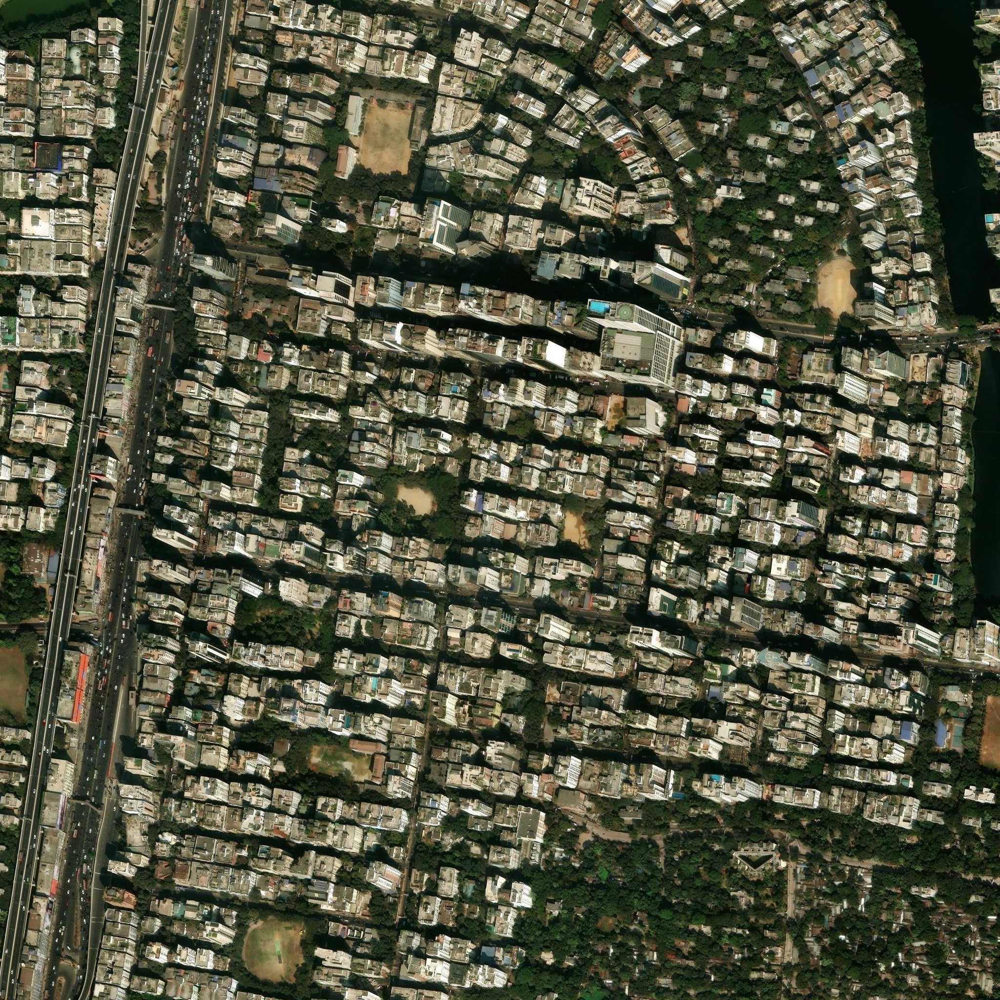

: 

In [ ]:
# Paste coordinates from OpenStreetMap (right-click a spot -> "Show address") or Google
# Maps - lat and lon together, comma or space separated, e.g. "23.860706, 90.368257".
import re

coords_raw = input("Latitude, Longitude: ").strip()
tokens = [t for t in re.split(r"[,\s]+", coords_raw) if t]
if len(tokens) < 2:
    raise ValueError(f"Need both lat and lon, got: {coords_raw!r}")
lat, lon = float(tokens[0]), float(tokens[1])
name = input("Short name for this area [default: aoi]: ").strip() or "aoi"

import download as dl
dl.download(lat, lon, name)

from IPython.display import Image as IPyImage, display
display(IPyImage(f"data/images/{name}.png", width=500))


In [7]:
import extract
from core.registry import discover

MODELS = ["samroad"]
available = discover()
results = {}

for m in MODELS:
    print(f"--- {m} ({available[m].description}) ---")
    try:
        extract.run(name, m)
        results[m] = {"ok": True, "description": available[m].description}
    except Exception as e:
        print(f"  ERROR: {e}")
        results[m] = {"ok": False, "description": available[m].description, "error": str(e)}


--- samroad (SAM ViT-B road graph, zero-shot on CityScale weights) ---
[extract] sdgsgdsg  model=samroad
[samroad] no GPU - running a 6x6 patch grid on CPU, this will take a few minutes
###### Matched params ######
['image_encoder.pos_embed',
 'image_encoder.patch_embed.proj.weight',
 'image_encoder.patch_embed.proj.bias',
 'image_encoder.blocks.0.norm1.weight',
 'image_encoder.blocks.0.norm1.bias',
 'image_encoder.blocks.0.attn.rel_pos_h',
 'image_encoder.blocks.0.attn.rel_pos_w',
 'image_encoder.blocks.0.attn.qkv.weight',
 'image_encoder.blocks.0.attn.qkv.bias',
 'image_encoder.blocks.0.attn.proj.weight',
 'image_encoder.blocks.0.attn.proj.bias',
 'image_encoder.blocks.0.norm2.weight',
 'image_encoder.blocks.0.norm2.bias',
 'image_encoder.blocks.0.mlp.lin1.weight',
 'image_encoder.blocks.0.mlp.lin1.bias',
 'image_encoder.blocks.0.mlp.lin2.weight',
 'image_encoder.blocks.0.mlp.lin2.bias',
 'image_encoder.blocks.1.norm1.weight',
 'image_encoder.blocks.1.norm1.bias',
 'image_encoder.blo

: 

: 

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image as PILImage

ok_models = [m for m in MODELS if results[m]["ok"]]
failed = [m for m in MODELS if not results[m]["ok"]]

if ok_models:
    fig, axes = plt.subplots(2, len(ok_models), figsize=(6 * len(ok_models), 10))
    if len(ok_models) == 1:
        axes = axes.reshape(2, 1)

    for i, m in enumerate(ok_models):
        title = results[m]["description"]   # real model name/description, not the short code
        overlay = PILImage.open(f"outputs/images/{name}_{m}.png")
        mask = PILImage.open(f"outputs/images/{name}_{m}_mask.png")

        axes[0, i].imshow(overlay)
        axes[0, i].set_title(title, fontsize=11)
        axes[0, i].axis("off")

        axes[1, i].imshow(mask, cmap="gray")
        axes[1, i].set_title(f"{title} - mask", fontsize=10)
        axes[1, i].axis("off")

    plt.tight_layout()
    plt.show()

for m in failed:
    print(f"[skipped] {results[m]['description']}: {results[m]['error']}")


In [ ]:
import shutil
from google.colab import files

shutil.make_archive("road_extraction_outputs", "zip", "outputs")
files.download("road_extraction_outputs.zip")
